In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t3 to t5
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 2).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 4).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast


In [10]:
# Save the array to disk
np.save('genesys_ctw_t3-t5.npy', ctw)

In [ ]:
ctw = np.load('genesys_ctw_t3-t5.npy')

In [ ]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [ ]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [ ]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [ ]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [ ]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: Name, dtype: int64

## Network analysis

In [ ]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [ ]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

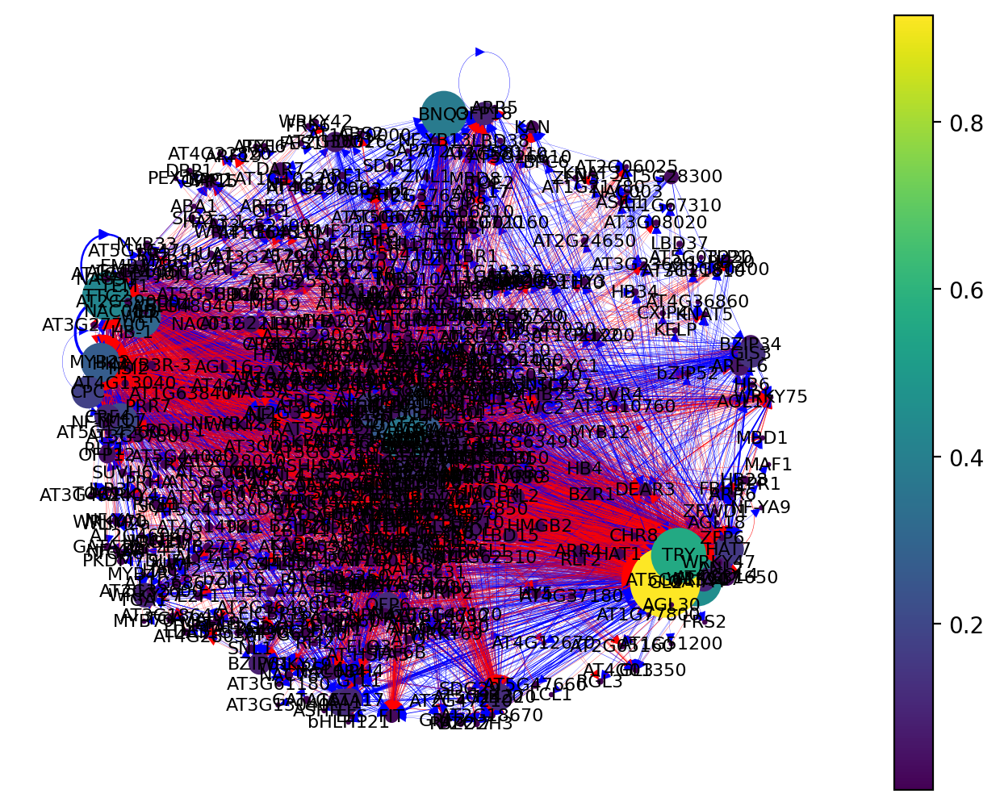

In [ ]:
atri = network(0)

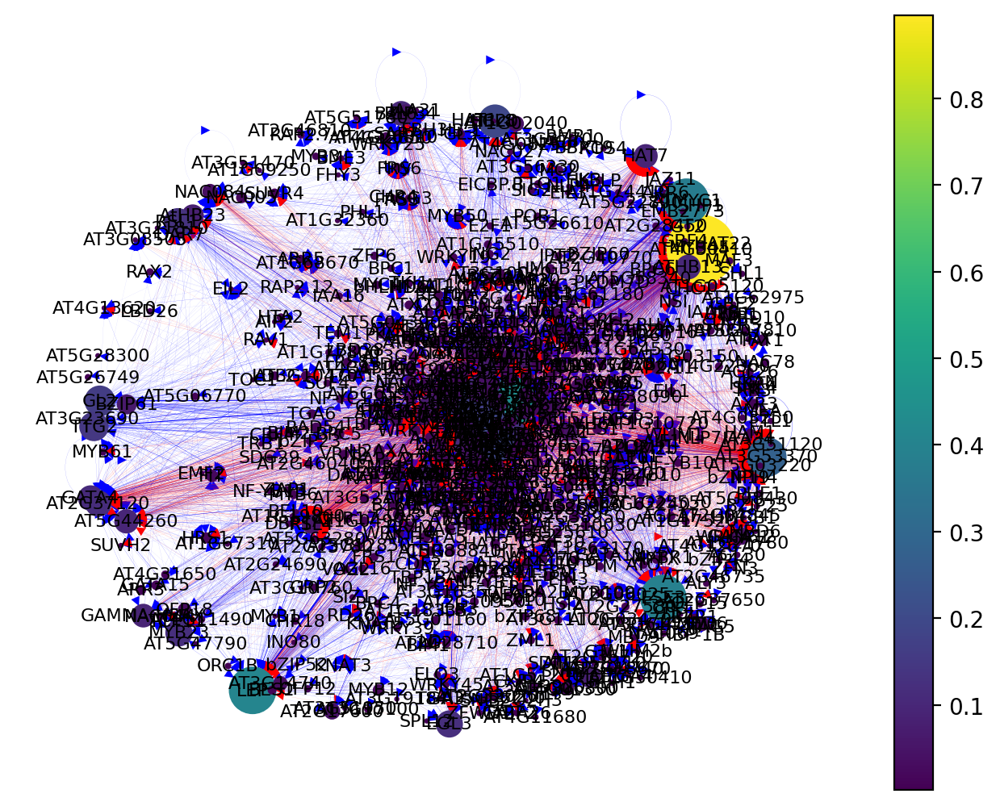

In [ ]:
tri = network(1)

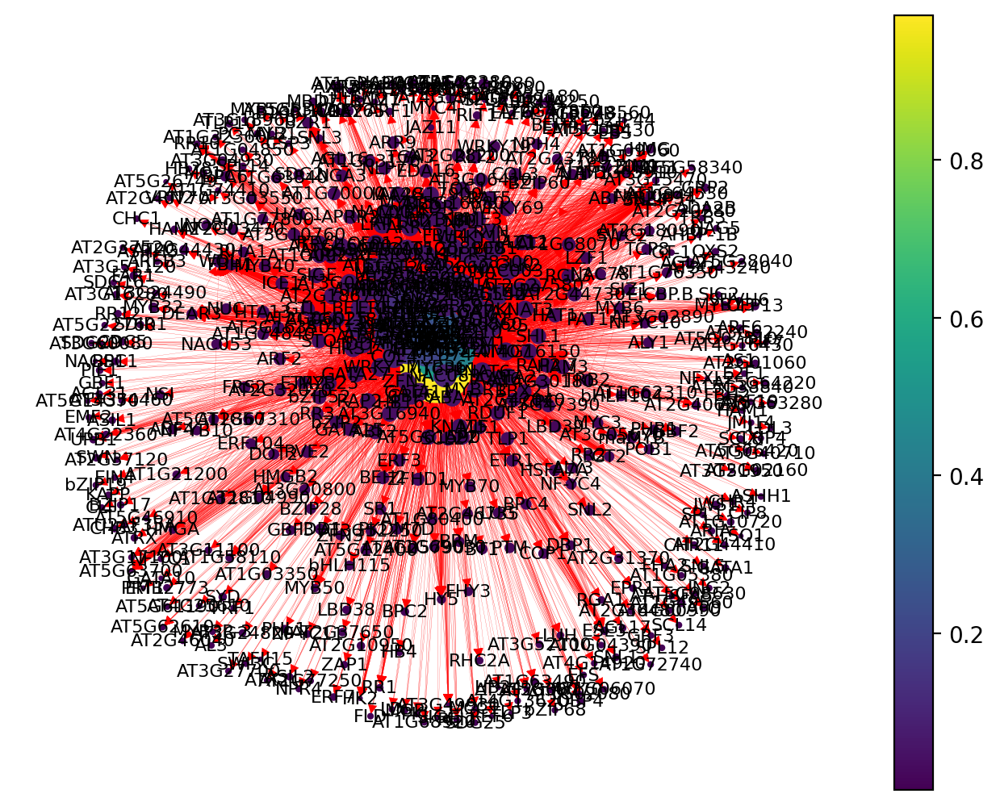

In [ ]:
cor = network(2)

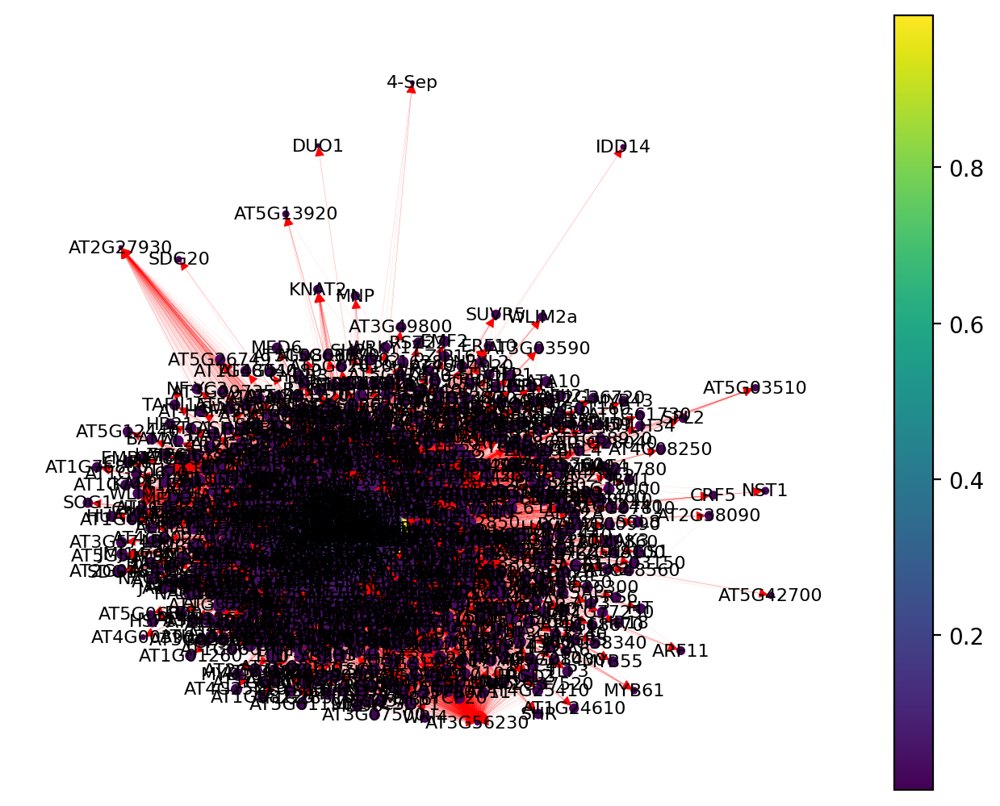

In [ ]:
end = network(3)

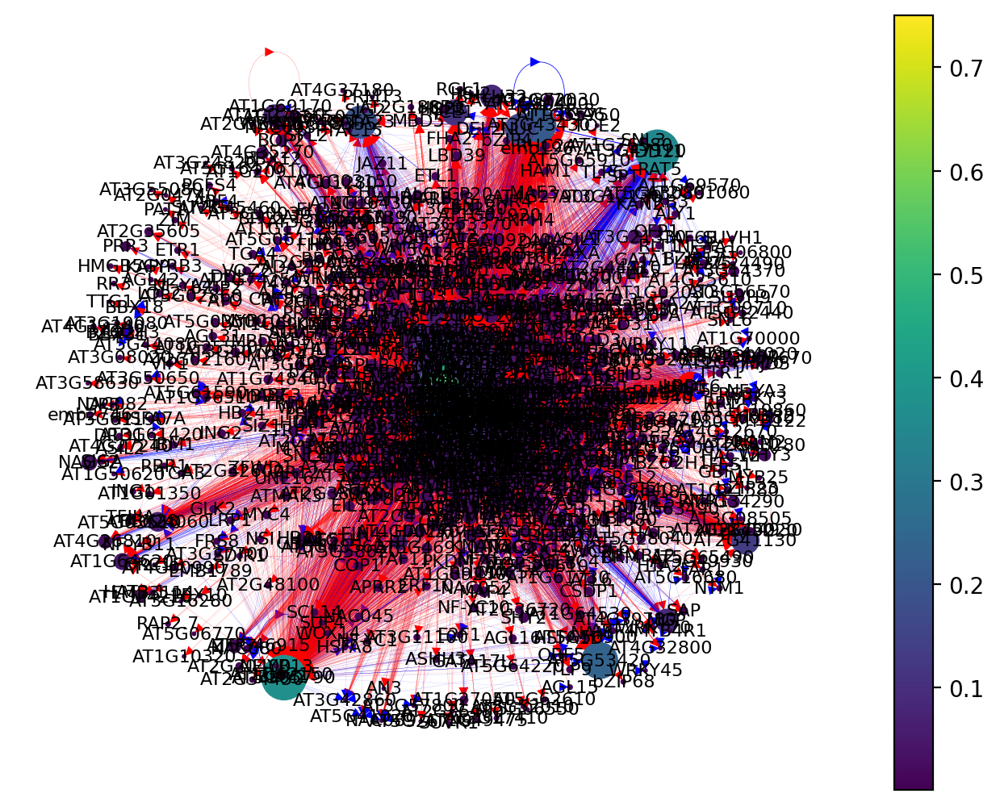

In [ ]:
per = network(4)

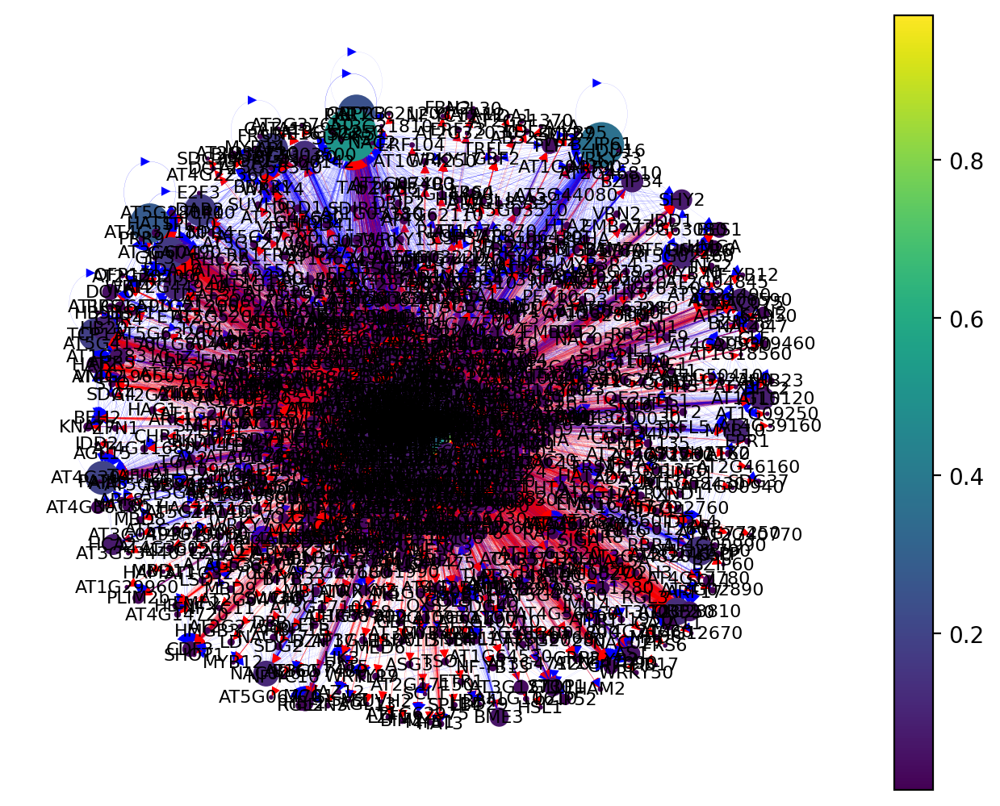

In [ ]:
pro = network(5)

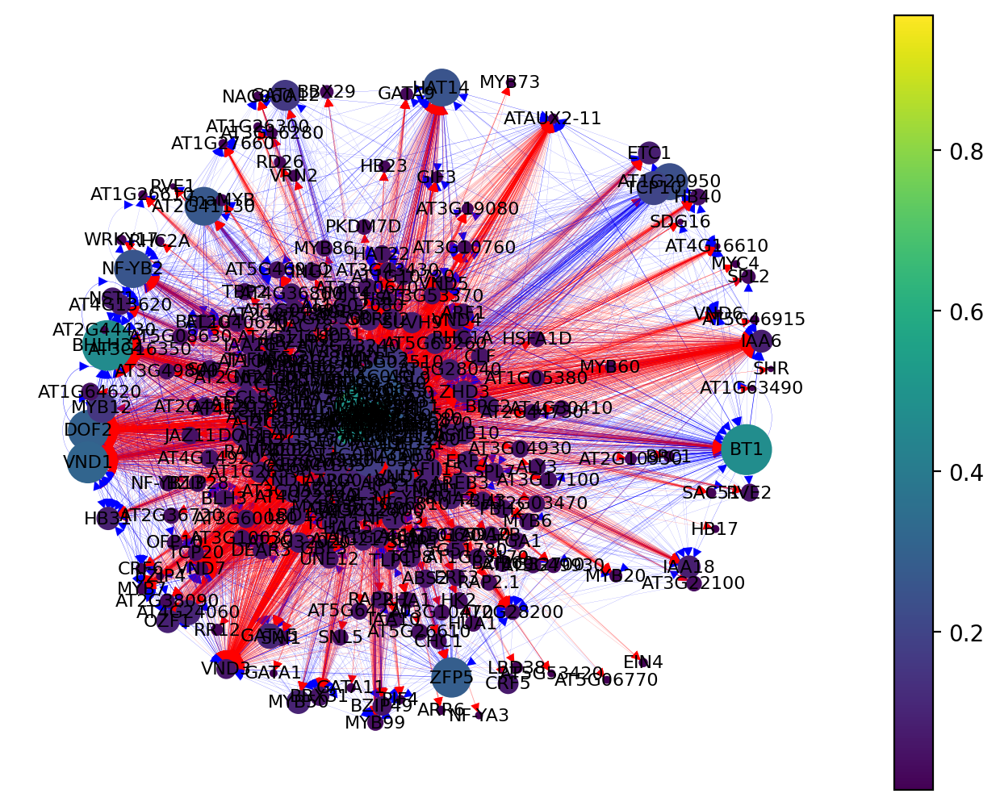

In [ ]:
xyl = network(6)

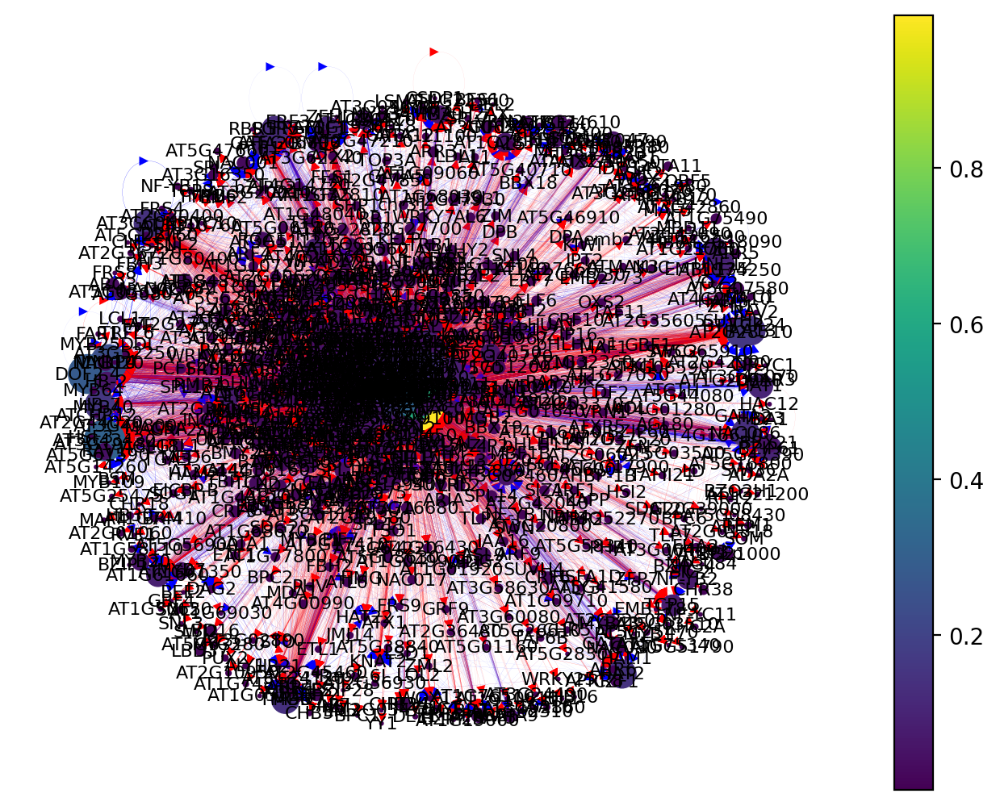

In [ ]:
phl = network(7)

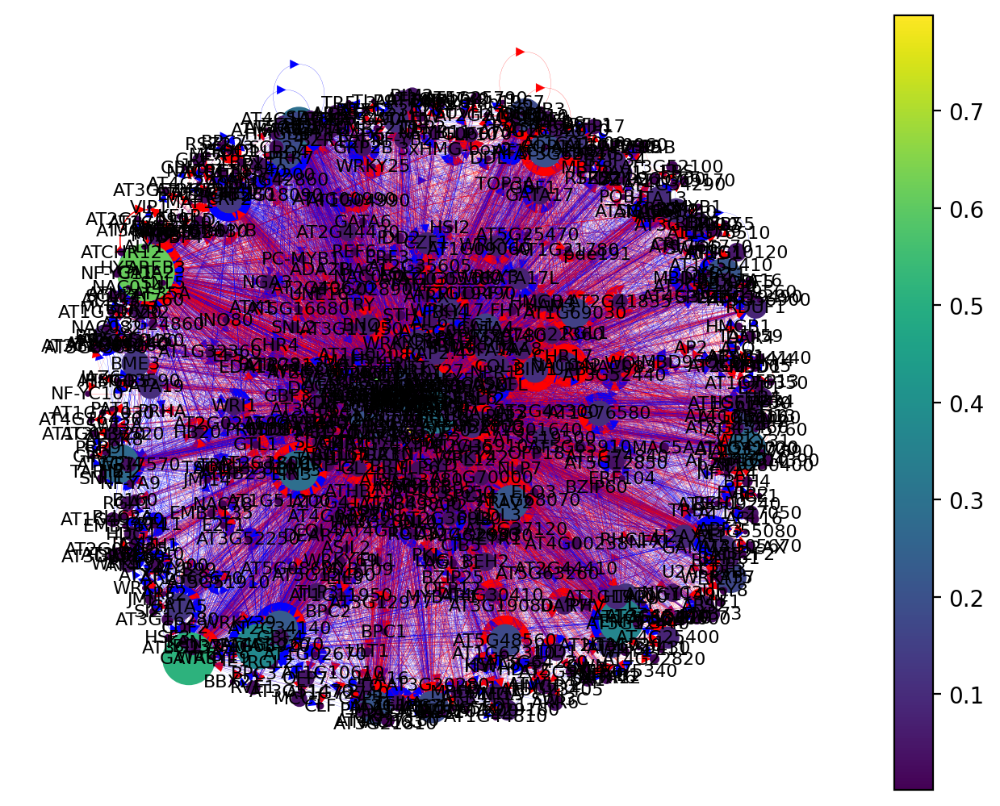

In [ ]:
lrc = network(8)

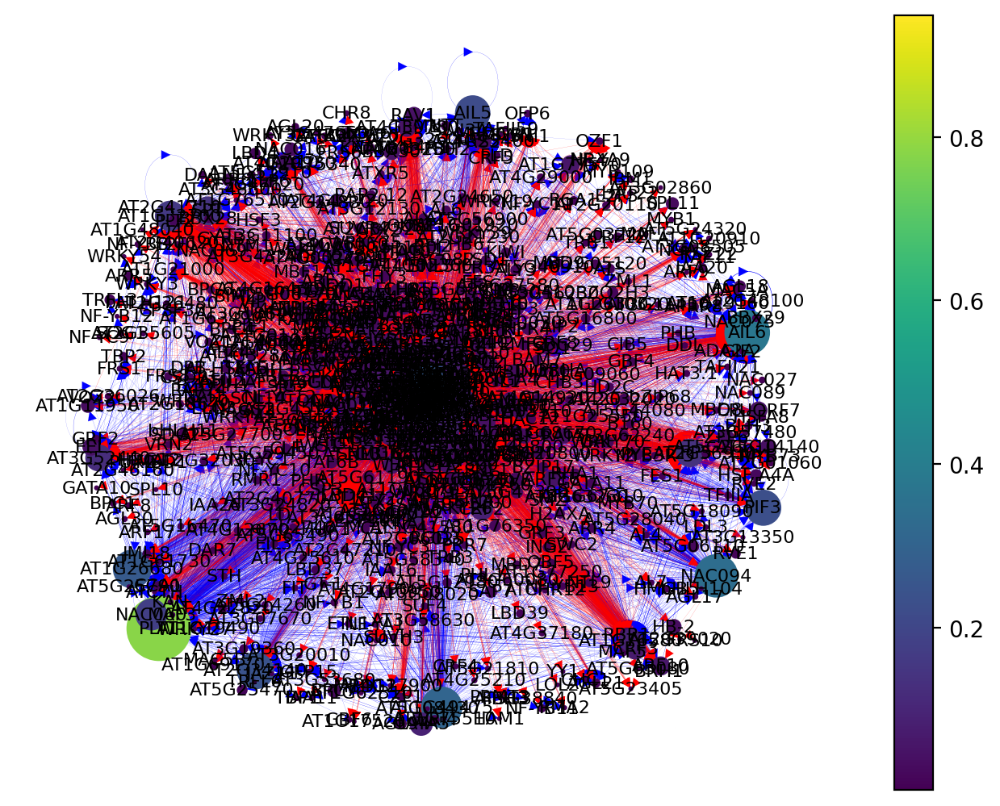

In [ ]:
col = network(9)

In [ ]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [ ]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts(), columns=['tf_occurance'])
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [ ]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
GL2,0.953274,0.001667,0.628124,0.927046,0.162257,0.039531,0.350534,0.003527,0.127379,9,12.193340
ATS,0.815165,0.005550,0.750948,0.183274,0.153439,0.163982,0.170819,0.049383,0.188873,9,11.481432
TTG2,0.927633,0.000745,0.007653,0.425267,0.146384,0.062958,0.720641,0.005291,0.105417,9,11.401989
IAA14,0.449128,0.199971,0.017018,0.265125,0.192240,0.098097,0.174377,0.068783,0.049780,9,10.514518
FIT,0.585533,0.006556,0.002656,0.024911,0.019400,0.017570,0.163701,0.019400,0.117130,9,9.956857


In [ ]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
AT3G53370,0.238250,0.717427,0.087189,0.276896,0.051601,0.871252,6,8.242615
AT2G37120,0.004485,0.551287,0.099644,0.116402,0.115658,0.252205,6,7.139681


In [ ]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
KAN,0.487970,0.023132,0.049822,3,3.560923
CRF4,0.399243,0.110320,0.069395,3,3.578958
OFP18,0.343676,0.088968,0.131673,3,3.564317
TRY,0.322683,0.560498,0.062278,3,3.945458
ARR6,0.007086,0.003559,0.040925,3,3.051570
GRF3,0.002303,0.037367,0.024911,3,3.064580
AT4G31650,0.001773,0.035587,0.067616,3,3.104976
AT3G52100,0.001725,0.010676,0.012456,3,3.024857
GIS3,0.001021,0.133452,0.007117,3,3.141591


In [ ]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
RSL4,0.969429,0.058201,0.604938,3,4.632568
LRL3,0.951605,0.204586,0.784832,3,4.941023
RSL2,0.795929,0.068783,0.421517,3,4.286228
AT4G39160,0.611684,0.067019,0.194004,3,3.872707
AT4G09100,0.611622,0.035273,0.477954,3,4.124850
ATMYC1,0.485395,0.373898,0.112875,3,3.972168
RL6,0.477487,0.100529,0.054674,3,3.632690
AT5G56200,0.422863,0.003527,0.052910,3,3.479300
RHD6,0.249328,0.128748,0.343915,3,3.721992
RAP2.11,0.220082,0.024691,0.098765,3,3.343538


In [ ]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
BRON,0.825382,0.199122,0.541728,3,4.566231
ERF9,0.767259,0.363104,0.260615,3,4.390978
CHR38,0.747223,0.185944,0.190337,3,4.123504
ASL1,0.735740,0.049780,0.260615,3,4.046135
AT3G60670,0.721004,0.207906,0.142020,3,4.070931
RITF1,0.710495,0.193265,0.165447,3,4.069207
LBD4,0.708130,0.188873,0.158126,3,4.055128
AT2G36930,0.703613,0.033675,0.109810,3,3.847097
AT2G46160,0.696178,0.095168,0.079063,3,3.870410
IAA33,0.692765,0.450952,0.142020,3,4.285737


In [ ]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
LBD41,0.850319,0.016082,0.507310,3,4.373710
NAM,0.709777,0.024854,0.220760,3,3.955391
AT5G41020,0.449368,0.051170,0.043860,3,3.544397
WRKY14,0.277934,0.045322,0.209064,3,3.532320
TRP1,0.264228,0.008772,0.092105,3,3.365105
PIF3,0.192704,0.228070,0.021930,3,3.442704
HSL1,0.129969,0.023392,0.086257,3,3.239618
AT3G12977,0.087989,0.024854,0.228070,3,3.340913
BZIP25,0.020354,0.049708,0.171053,3,3.241115
AT2G42300,0.009894,0.042398,0.160819,3,3.213110


In [ ]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
MYB74,0.067311,0.265845,0.542308,0.749035,0.007692,0.996139,6,8.628331
JKD,0.032763,0.053518,0.300000,0.284427,0.532692,0.471042,6,7.674443
MYB68,0.000022,0.008478,0.275000,0.374517,0.001923,0.984556,6,7.644497
RAX2,0.000174,0.010255,0.242308,0.158301,0.025000,0.970399,6,7.406437
BLJ,0.000122,0.006241,0.173077,0.105534,0.017308,0.962677,6,7.264959
...,...,...,...,...,...,...,...,...
ZFN3,0.000030,0.000073,0.011538,0.029601,0.017308,0.009009,6,6.067559
AT1G72010,0.000004,0.000041,0.013462,0.033462,0.003846,0.016731,6,6.067546
MYB13,0.000007,0.000053,0.007692,0.033462,0.019231,0.006435,6,6.066881
MBD7,0.000445,0.000456,0.007692,0.024453,0.011538,0.016731,6,6.061316


In [ ]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G38300,0.006625,0.061538,0.532692,3,3.600856
MYB86,0.002905,0.048077,0.225000,3,3.275982
AT3G49930,0.001264,0.001923,0.032692,3,3.035879
AT2G42660,0.000815,0.065385,0.215385,3,3.281584
SHL1,0.000734,0.036538,0.007692,3,3.044964
IAA16,0.000463,0.040385,0.013462,3,3.054309
AT5G07810,0.000274,0.003846,0.032692,3,3.036813
RGL3,0.000233,0.026923,0.300000,3,3.327157
AT1G76350,0.000185,0.013462,0.007692,3,3.021339
AT3G04930,0.000089,0.007692,0.005769,3,3.013550


In [ ]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
AT5G51790,0.038008,0.007722,0.059202,3,3.104932
AT2G45120,0.015278,0.007722,0.056628,3,3.079628
BIB,0.014205,0.064350,0.253539,3,3.332094
AT2G27930,0.009614,0.001287,0.153153,3,3.164055
4-Sep,0.006045,0.001287,0.006435,3,3.013767
...,...,...,...,...,...
AT2G03470,0.000003,0.045045,0.016731,3,3.061779
PHR1,0.000002,0.036036,0.005148,3,3.041186
BPC4,0.000002,0.041184,0.010296,3,3.051482
CCA1,0.000002,0.041184,0.020592,3,3.061778


In [ ]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
MYB88,0.009783,0.011002,0.203635,0.004870,0.115055,0.199792,0.488525,0.099626,0.122399,0.291363,0.337705,0.090909,12,13.974663
ATAUX2-11,0.000015,0.000028,0.704487,0.000036,0.088127,0.045786,0.013115,0.042341,0.037944,0.444329,0.560656,0.013699,12,13.950561
AT1G12440,0.000066,0.036612,0.000075,0.080959,0.166463,0.354839,0.373770,0.049813,0.095471,0.160250,0.111475,0.039851,12,13.469645
IAA11,0.005155,0.000192,0.000539,0.310565,0.057528,0.031217,0.232787,0.098381,0.187271,0.101977,0.259016,0.180573,12,13.465202


In [ ]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT2G20100,0.738585,0.025704,0.104039,3,3.868328
IDD11,0.447962,0.350061,0.075887,3,3.873911
GATA23,0.149711,0.189718,0.044064,3,3.383493
AT2G35605,0.040975,0.009792,0.009792,3,3.060559
AT1G27660,0.037554,0.077111,0.089351,3,3.204016
ERF12,0.025974,0.078335,0.265606,3,3.369915
AT3G21330,0.019212,0.033048,0.003672,3,3.055932
HDA3,0.004984,0.020808,0.057528,3,3.083320
AT2G44020,0.004485,0.009792,0.003672,3,3.017949
ATWHY2,0.003670,0.036720,0.059976,3,3.100366


In [ ]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
ASL9,0.293906,0.040583,0.035380,3,3.369869
HB21,0.048301,0.040583,0.118626,3,3.207511
AT2G36340,0.027752,0.107180,0.061394,3,3.196327
AT4G25410,0.014994,0.170656,0.110302,3,3.295951
AT4G17780,0.002061,0.001041,0.014568,3,3.017669
GAI,0.001636,0.058273,0.097815,3,3.157723
MYB10,0.001381,0.104058,0.037461,3,3.142900
HAT3,0.001025,0.004162,0.054110,3,3.059298
ARF19,0.000079,0.081165,0.046826,3,3.128071
HMGB6,0.000046,0.003122,0.006243,3,3.009411


In [ ]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
VND2,0.896462,0.147541,0.970492,3,5.014495
IAA31,0.705878,0.186885,0.596721,3,4.489484
LBD31,0.699418,0.173770,0.078689,3,3.951877
VND7,0.673069,0.026230,0.816393,3,4.515692
AT1G66810,0.671506,0.098361,0.373770,3,4.143637
VND3,0.595308,0.062295,0.885246,3,4.542849
JLO,0.526478,0.209836,0.209836,3,3.946150
AT1G29950,0.512360,0.239344,0.006557,3,3.758261
IAA6,0.497390,0.085246,0.829508,3,4.412144
XND1,0.397972,0.081967,0.809836,3,4.289776


In [ ]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
GATA19,0.554558,0.044832,0.014944,3,3.614334
AT2G03500,0.426435,0.625156,0.478207,3,4.529798
FLP,0.353997,0.087173,0.105853,3,3.547023
REM22,0.347550,0.110834,0.069738,3,3.528122
AT3G12730,0.265207,0.612702,0.745953,3,4.623862
AT1G47570,0.254227,0.080946,0.068493,3,3.403667
HCA2,0.116451,0.498132,0.323786,3,3.938369
NAC086,0.078297,0.135741,0.075965,3,3.290004
bZIP4,0.053225,0.063512,0.021171,3,3.137907
GATA20,0.049798,0.108344,0.112080,3,3.270221


## Search for individual genes

In [ ]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,...,pro_degree_centrality,pro_out_centrality,pro_in_centrality,pro_closeness_centrality,pro_eigenvector_centrality,xyl_degree_centrality,xyl_out_centrality,xyl_in_centrality,xyl_closeness_centrality,xyl_eigenvector_centrality
SHR,2.0,0.023166,0.01287,0.010296,0.000035,0.000412,0.011793,0.0612,0.035496,0.025704,...,0.091571,0.067638,0.023933,0.000373,0.034132,0.006557,0.003279,0.003279,0.000265,0.002608


In [ ]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,2.0,0.190385,0.173077,0.017308,0.000122,0.000336,0.083232,1.068211,0.105534,0.962677,0.006241,0.000741,0.140119


In [ ]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
JKD,2.0,0.832692,0.3,0.532692,0.032763,0.000398,0.148301,0.75547,0.284427,0.471042,0.053518,0.000884,0.104607


In [ ]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
RVN,2.0,0.059615,0.046154,0.013462,0.001267,0.000293,0.036808,0.111969,0.088803,0.023166,0.000066,0.000725,0.041572


In [ ]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,1.0,0.317889,0.06435,0.253539,0.014205,0.000666,0.072223


In [ ]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [ ]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [ ]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,tri_betweenness_centrality,tri_closeness_centrality,tri_eigenvector_centrality,lrc_degree_centrality,lrc_out_centrality,lrc_in_centrality,lrc_betweenness_centrality,lrc_closeness_centrality,lrc_eigenvector_centrality
GL2,3.0,1.27758,0.927046,0.350534,0.953274,0.000641,0.206807,0.165785,0.162257,0.003527,0.001667,0.001008,0.078785,0.166911,0.039531,0.127379,0.628124,0.000623,0.053754


In [54]:
tf_spec.to_csv('TF_GRN_centrality_t3-t5_zscore3.csv', index=True)